# Climatología de Temperatura Observada

## Importar librerias

In [19]:
import glob
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import copy #crear copias

## Abrir todos los archivos excel por cuenca

In [3]:
# Criterios de coincidencia de patrones para archivos de Excel en el directorio
filenames = 'C:/Users/arias/OneDrive/Documentos/UCR/TFG/Datos/Observado/Temperatura/Cuencas/Cuenca*.xlsx'

In [4]:
# Crea un diccionario vacío para almacenar los datos de cada archivo
dat = {}

# Recorra cada archivo de Excel que coincida con el patrón y lea sus datos en un marco de datos de pandas
for file in glob.glob(filenames):
    dat[file] = pd.read_excel(file)

In [5]:
# Access the data from each file using its file name as the key in the data_dict
data_new = []

for file, data in dat.items():
    data_new.append(data)

## Arreglar datos

* En la columna 'ESTACION' todos los valores tengan 3 digitos

In [6]:
for i, df in enumerate(data_new):
    def formatear_valor(valor):
        if valor < 10:
            return '00' + str(valor)
        elif valor < 100:
            return '0' + str(valor)
        else:
            return str(valor)

    # Aplicar la función a la tabla
    data_new[i]['ESTACION'] = data_new[i]['ESTACION'].apply(formatear_valor)

In [7]:
#Unir el numero de 'CUENCA' con 'ESTACION' para tener el numero de cada estacion
for i, df in enumerate(data_new):
    data_new[i]['ESTACION_NEW'] = data_new[i]['CUENCA'].astype(str) + data_new[i]['ESTACION'].astype(str)

In [8]:
#Eliminar las columnas que no son necesarias
for i, df in enumerate(data_new):
    data_new[i].pop('CUENCA')
    data_new[i].pop('ESTACION')

## Agrupar datos por estación

* Agrupar las filas según los valores de la columna "ESTACION_NEW"

In [9]:
my_list = list(range(0, 22))
porestacion=[]
for i in my_list:
    grupos = data_new[i].groupby('ESTACION_NEW')

    # Crear una tabla separada para cada grupo segun 'ESTACION_NEW'
    for ESTACION, grupo in grupos:
        # Obtener el DataFrame correspondiente a cada grupo
        tabla = grupos.get_group(ESTACION)
        porestacion.append(tabla) #Adjuntar los valores

* Obtener el número de cada estación

In [10]:
NUMERO = copy.deepcopy(porestacion)
for i, df in enumerate(NUMERO):
    NUMERO[i] = NUMERO[i].iloc[0,3]

* Separar los datos por temperatura maxima, minima y promedio
* Eliminar las columnas que no son necesarias

In [11]:
#Utilizar la función deepcopy() de copy para no alterar la lista original.
TempMAX = copy.deepcopy(porestacion)

#Eliminar las columnas que no son necesarias
for i, df in enumerate(TempMAX):
    TempMAX[i].pop('MIN')
    TempMAX[i].pop('ESTACION_NEW')

In [12]:
TempMIN = copy.deepcopy(porestacion)

#Eliminar las columnas que no son necesarias
for i, df in enumerate(TempMIN):
    TempMIN[i].pop('MAX')
    TempMIN[i].pop('ESTACION_NEW')

* Ordenar valores a partir de la columna 'Tmax' y 'Tmin'

In [13]:
#-------------------------Tmax-----------------------#
# Suponiendo que TempMAX es una lista de tablas
TempMAX_ordenada = []
# Iterar a través de las tablas en la lista original
for df in TempMAX:
    # Ordenar la tabla por la columna deseada
    df_ordenado = df.sort_values('MAX', ascending=True)
    # Agregar la tabla ordenada a la nueva lista
    TempMAX_ordenada.append(df_ordenado)

#-------------------------Tmin-----------------------#
# Crear la nueva lista vacía
TempMIN_ordenada = []

# Iterar a través de las tablas en la lista original
for df in TempMIN:
    # Ordenar la tabla por la columna deseada
    df_ordenado = df.sort_values('MIN', ascending=True)
    # Agregar la tabla ordenada a la nueva lista
    TempMIN_ordenada.append(df_ordenado)

* Eliminar las filas con 0 o valores negativos
* Paso no necesario

In [14]:
#-------------------------Tmax-----------------------#
# Crear una lista vacía para almacenar los valores eliminados
Tmax_eliminados = []

# Iterar a través de la lista de DataFrames y eliminar las filas donde 'LLUVIA_DIARIA' es 0
for i, df in enumerate(TempMAX_ordenada):
    eliminados = df.loc[(df['MAX'] == 0) | (df['MAX'] < 0)]
    TempMAX_ordenada[i] = df.loc[df['MAX'] > 0] #Eliminar de cada tabla los valores 0 y negativos
    Tmax_eliminados.append(eliminados)
    
#-------------------------Tmin-----------------------#
# Crear una lista vacía para almacenar los valores eliminados
Tmin_eliminados = []

# Iterar a través de la lista de DataFrames y eliminar las filas donde 'LLUVIA_DIARIA' es 0
for i, df in enumerate(TempMIN_ordenada):
    eliminados = df.loc[(df['MIN'] == 0) | (df['MIN'] < 0)]
    TempMIN_ordenada[i] = df.loc[df['MIN'] > 0] #Eliminar de cada tabla los valores 0 y negativos
    Tmin_eliminados.append(eliminados)

In [16]:
TempMIN_ordenada

[          FECHA    MIN
 1946 2009-07-14  15.10
 1943 2009-07-11  15.37
 1944 2009-07-12  17.09
 1950 2009-07-18  17.63
 1947 2009-07-15  17.86
 ...         ...    ...
 4160 2016-03-02  26.00
 2102 2010-03-10  26.04
 4208 2016-04-19  26.10
 4184 2016-03-26  26.30
 4190 2016-04-01  26.50
 
 [6656 rows x 2 columns],
           FECHA    MIN
 7939 2011-06-06   7.89
 7940 2011-06-07   8.30
 7938 2011-06-05   9.05
 7930 2011-05-28   9.15
 7931 2011-05-29   9.39
 ...         ...    ...
 9390 2015-06-02  25.50
 9690 2016-05-16  25.50
 9696 2016-05-22  25.50
 7944 2011-06-13  25.63
 9416 2015-06-28  25.80
 
 [5355 rows x 2 columns],
            FECHA    MIN
 12426 2011-01-30  17.76
 14600 2017-01-15  18.00
 13910 2015-02-24  18.15
 14628 2017-02-12  18.20
 15332 2019-01-18  18.40
 ...          ...    ...
 15894 2020-08-02  25.30
 12170 2010-05-19  25.37
 15810 2020-05-10  25.40
 12103 2010-03-13  25.47
 12099 2010-03-09  25.66
 
 [4765 rows x 2 columns],
            FECHA    MIN
 17232 2014-07-

## Obtener Boxplot

* Boxplot temperatura máxima

C:\Users\arias\AppData\Local\Temp\ipykernel_170876\4092455236.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


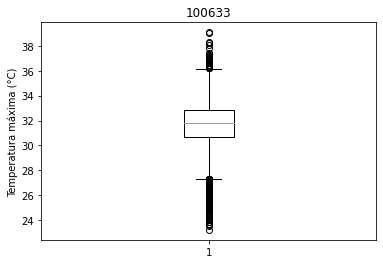

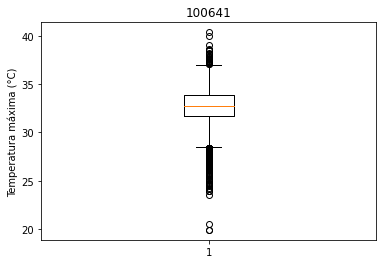

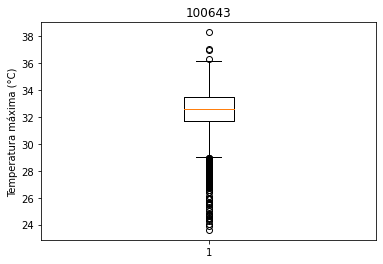

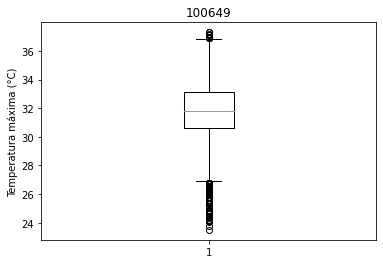

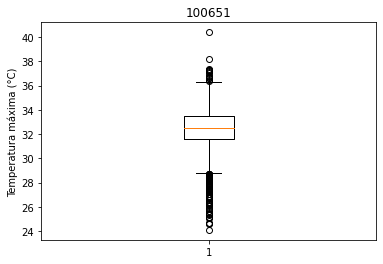

...

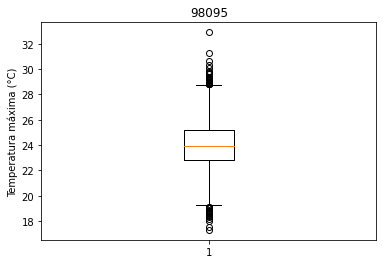

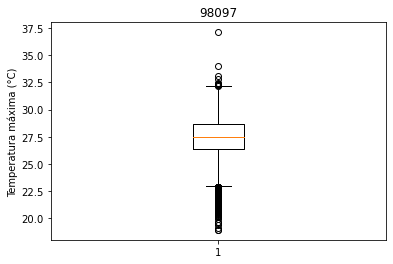

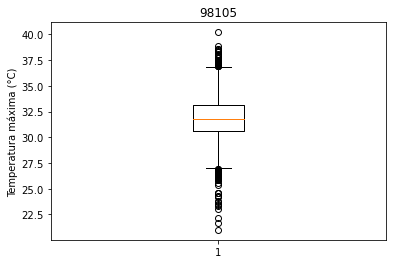

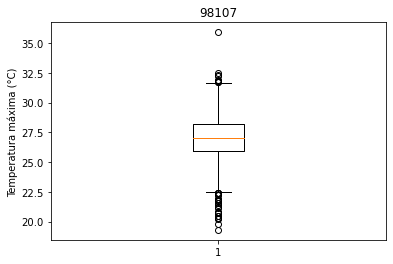

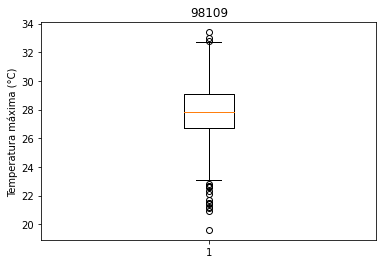

In [21]:
def detect_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    outliers = df[(df[column] < Q1 - 1.5 * IQR) | (df[column] > Q3 + 1.5 * IQR)][column]
    return Q1, Q3, outliers

# Crear el archivo Excel
writer = pd.ExcelWriter('C:/Users/arias/OneDrive/Documentos/UCR/TFG/Datos/Observado/Temperatura/Boxplot/Tmax/boxplot_data_tmax.xlsx', engine='xlsxwriter')

# Iterar a través de las tablas y nombres de estaciones
data = TempMAX_ordenada
for i in range(len(data)):
    # Obtener la tabla y el nombre de la estación
    df = data[i]
    estacion = NUMERO[i]
    
    # Crear el boxplot
    plt.figure()
    plt.boxplot(df['MAX'])
    plt.title(estacion)
    plt.ylabel('Temperatura máxima (°C)')
    
    # Obtener los valores atípicos y guardarlos en una hoja de Excel
    Q1, Q3, outliers = detect_outliers(df, 'MAX')
    outliers_df = df.loc[df['MAX'].isin(outliers)][['FECHA', 'MAX']]
    outliers_df['Q1'] = Q1
    outliers_df['Q3'] = Q3
    outliers_df.to_excel(writer, sheet_name=estacion, index=False)

    nombre_archivo = 'C:/Users/arias/OneDrive/Documentos/UCR/TFG/Datos/Observado/Temperatura/Boxplot/Tmax/boxplot_{}.png'.format(estacion)
    plt.savefig(nombre_archivo, dpi=300)
    
# Guardar el archivo Excel
writer.save()

* Boxplot temperatura mínima

C:\Users\arias\AppData\Local\Temp\ipykernel_170876\1728097298.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


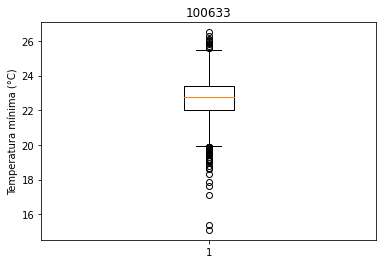

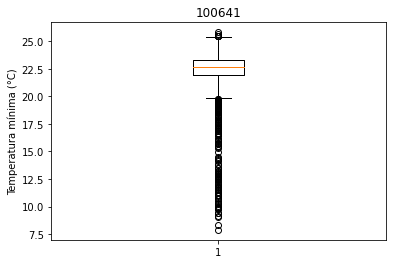

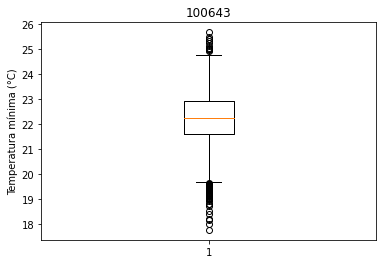

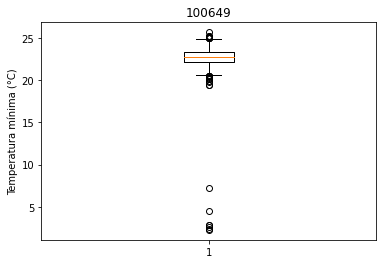

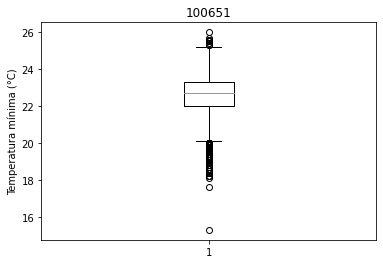

...

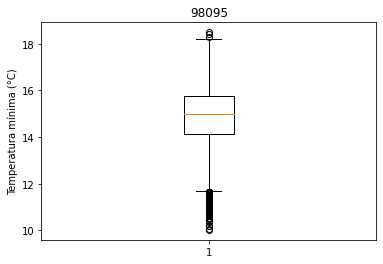

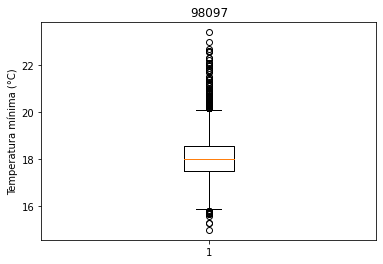

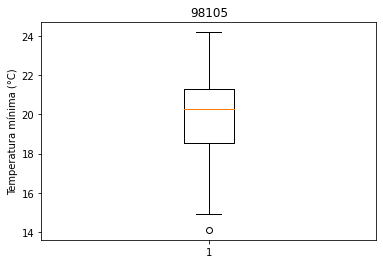

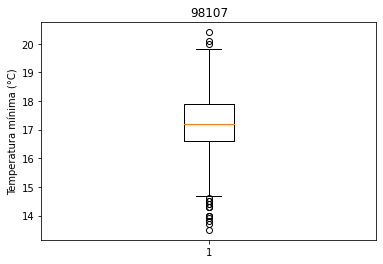

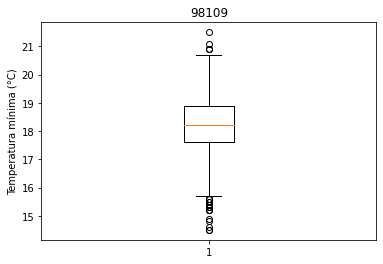

In [20]:
def detect_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    outliers = df[(df[column] < Q1 - 1.5 * IQR) | (df[column] > Q3 + 1.5 * IQR)][column]
    return Q1, Q3, outliers

# Crear el archivo Excel
writer = pd.ExcelWriter('C:/Users/arias/OneDrive/Documentos/UCR/TFG/Datos/Observado/Temperatura/Boxplot/Tmin/boxplot_data_tmin.xlsx', engine='xlsxwriter')

# Iterar a través de las tablas y nombres de estaciones
data = TempMIN_ordenada
for i in range(len(data)):
    # Obtener la tabla y el nombre de la estación
    df = data[i]
    estacion = NUMERO[i]
    
    # Crear el boxplot
    plt.figure()
    plt.boxplot(df['MIN'])
    plt.title(estacion)
    plt.ylabel('Temperatura mínima (°C)')
    
    # Obtener los valores atípicos y guardarlos en una hoja de Excel
    Q1, Q3, outliers = detect_outliers(df, 'MIN')
    outliers_df = df.loc[df['MIN'].isin(outliers)][['FECHA', 'MIN']]
    outliers_df['Q1'] = Q1
    outliers_df['Q3'] = Q3
    outliers_df.to_excel(writer, sheet_name=estacion, index=False)

    nombre_archivo = 'C:/Users/arias/OneDrive/Documentos/UCR/TFG/Datos/Observado/Temperatura/Boxplot/Tmin/boxplot_{}.png'.format(estacion)
    plt.savefig(nombre_archivo, dpi=300)
    
# Guardar el archivo Excel
writer.save()

## Campana de Gauss

* Graficar la campana de gauss temperatura máxima

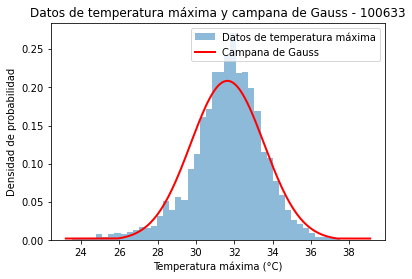

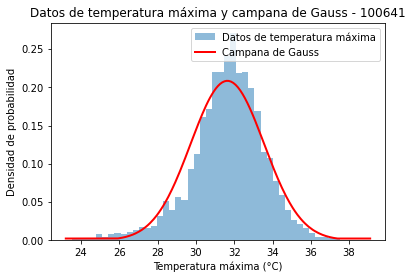

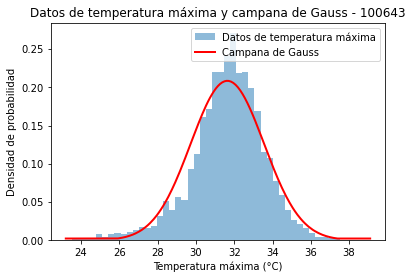

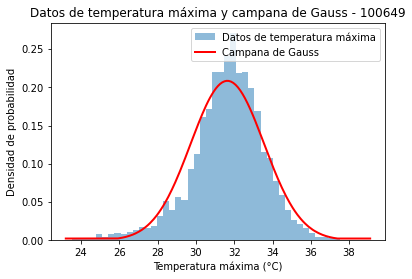

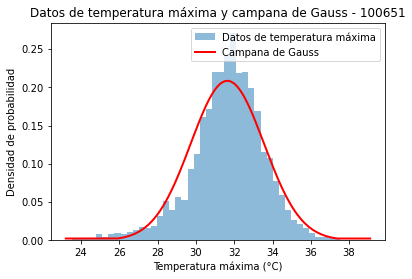

...

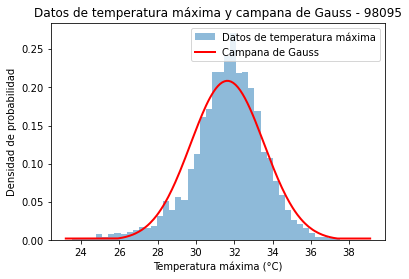

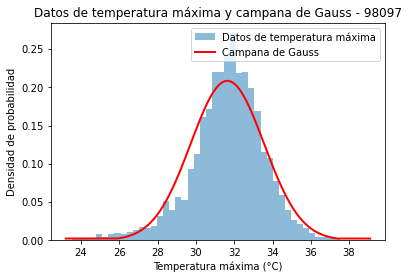

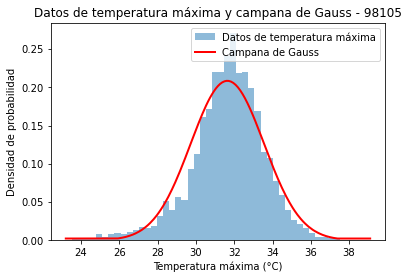

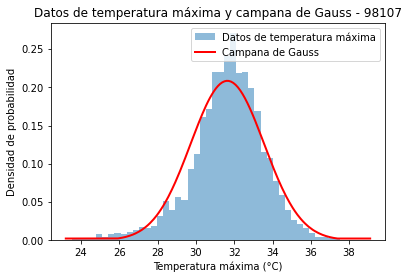

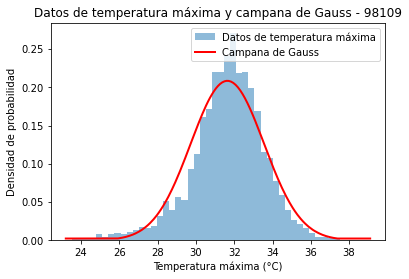

In [22]:
# Definir la función de campana de Gauss
def gaussian(x, mu, sigma):
    return 1 / (sigma * np.sqrt(2 * np.pi)) * np.exp(-0.5 * ((x - mu) / sigma) ** 2)

# Aplicar la campana de Gauss a cada tabla y guardar los resultados en una nueva lista de tablas
tmax_gauss = []
data = TempMAX_ordenada
for name,tabla in zip(NUMERO,data):
    # Calcular el promedio y la desviación estándar de los datos de precipitación
    mu = tabla['MAX'].mean()
    sigma = tabla['MAX'].std()
    # Crear un rango de valores para la variable x
    x = np.linspace(mu - 3 * sigma, mu + 3 * sigma, 100)
    # Calcular los valores de la campana de Gauss para cada valor de x
    y = gaussian(x, mu, sigma)
    # Agregar los valores de la campana de Gauss a la tabla
    tabla['GAUSS'] = np.interp(tabla['MAX'], x, y)
    # Agregar la tabla a la lista de tablas de resultados
    tmax_gauss.append(tabla)

    # Graficar los resultados para una tabla
    tabla = tmax_gauss[0]
    plt.hist(tabla['MAX'], bins=50, density=True, alpha=0.5, label='Datos de temperatura máxima')
    plt.plot(tabla['MAX'], tabla['GAUSS'], 'r-', linewidth=2, label='Campana de Gauss')
    plt.xlabel('Temperatura máxima (°C)')
    plt.ylabel('Densidad de probabilidad')
    plt.title(f'Datos de temperatura máxima y campana de Gauss - {name}')
    plt.legend()
    plt.show()

* Graficar la campana de gauss temperatura mínima

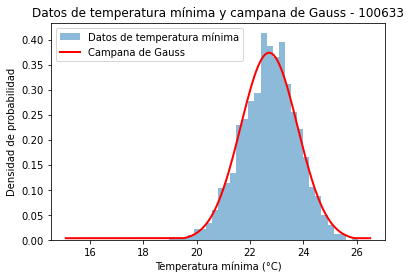

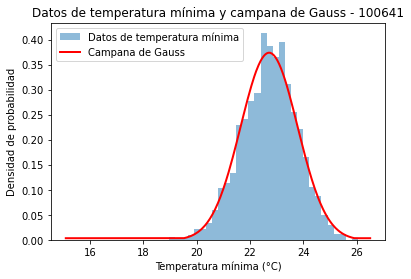

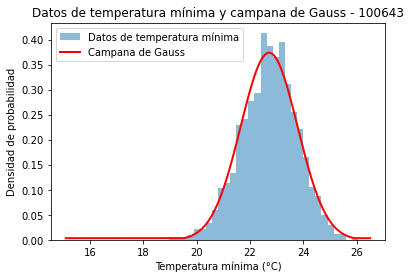

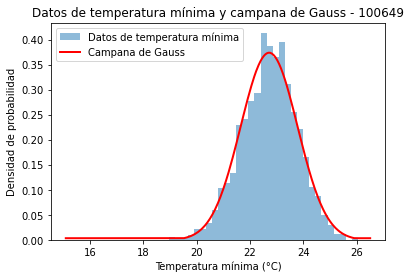

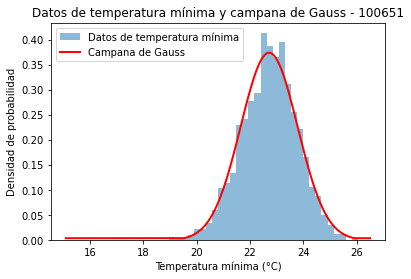

...

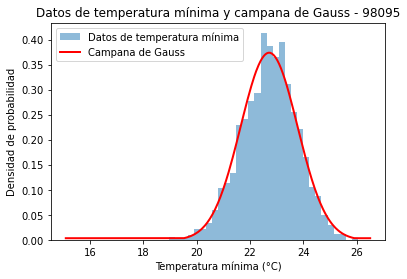

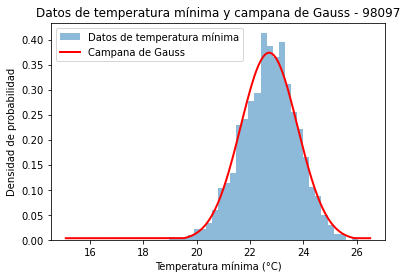

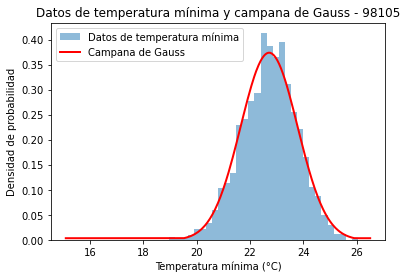

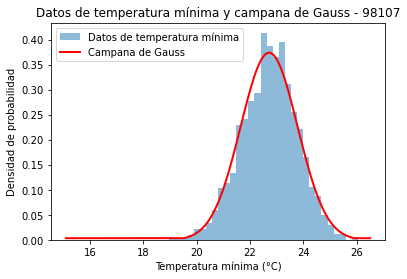

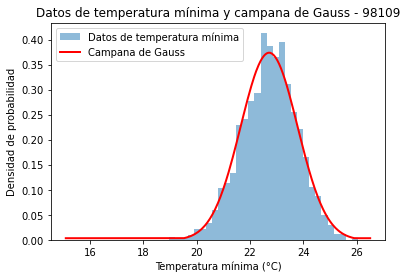

In [23]:
# Definir la función de campana de Gauss
def gaussian(x, mu, sigma):
    return 1 / (sigma * np.sqrt(2 * np.pi)) * np.exp(-0.5 * ((x - mu) / sigma) ** 2)

# Aplicar la campana de Gauss a cada tabla y guardar los resultados en una nueva lista de tablas
tmin_gauss = []
data = TempMIN_ordenada
for name,tabla in zip(NUMERO,data):
    # Calcular el promedio y la desviación estándar de los datos de precipitación
    mu = tabla['MIN'].mean()
    sigma = tabla['MIN'].std()
    # Crear un rango de valores para la variable x
    x = np.linspace(mu - 3 * sigma, mu + 3 * sigma, 100)
    # Calcular los valores de la campana de Gauss para cada valor de x
    y = gaussian(x, mu, sigma)
    # Agregar los valores de la campana de Gauss a la tabla
    tabla['GAUSS'] = np.interp(tabla['MIN'], x, y)
    # Agregar la tabla a la lista de tablas de resultados
    tmin_gauss.append(tabla)

    # Graficar los resultados para una tabla
    tabla = tmin_gauss[0]
    plt.hist(tabla['MIN'], bins=50, density=True, alpha=0.5, label='Datos de temperatura mínima')
    plt.plot(tabla['MIN'], tabla['GAUSS'], 'r-', linewidth=2, label='Campana de Gauss')
    plt.xlabel('Temperatura mínima (°C)')
    plt.ylabel('Densidad de probabilidad')
    plt.title(f'Datos de temperatura mínima y campana de Gauss - {name}')
    plt.legend()
    plt.show()

## Percentiles 25 y 75

* Obtener los percentiles de tmax y tmin

In [24]:
#-------------------------Tmax-----------------------#
# Crear una lista vacía para almacenar los valores eliminados
percentil_tmax_25 = []
percentil_tmax_75 = []

for tabla in TempMAX_ordenada:
    temp_max = tabla['MAX']
    percentil_tmax_25.append(np.percentile(temp_max, 25))
    percentil_tmax_75.append(np.percentile(temp_max, 75))
    
#-------------------------Tmin-----------------------#
percentil_tmin_25 = []
percentil_tmin_75 = []

for tabla in TempMIN_ordenada:
    temp_min = tabla['MIN']
    percentil_tmin_25.append(np.percentile(temp_min, 25))
    percentil_tmin_75.append(np.percentile(temp_min, 75))

* Obtener el rango intercuartilico

In [25]:
#-------------------------Tmax-----------------------#
IQR_max = np.array(percentil_tmax_75) - np.array(percentil_tmax_25)
    
#-------------------------Tmin-----------------------#
IQR_min = np.array(percentil_tmin_75) - np.array(percentil_tmin_25)


* Convertir en NaN todos los valores anomalos

In [26]:
#-------------------------Tmax-----------------------#
for i, tabla in enumerate(TempMAX_ordenada):
    temp_max = tabla['MAX']
    tabla['MAX'] = np.where((temp_max < (percentil_tmax_25[i] - 1.5 * IQR_max[i])) | (temp_max > (percentil_tmax_75[i] + 1.5 * IQR_max[i])), np.nan, temp_max)
    
#-------------------------Tmin-----------------------#
for i, tabla in enumerate(TempMIN_ordenada):
    temp_min = tabla['MIN']
    tabla['MIN'] = np.where((temp_min < (percentil_tmin_25[i] - 1.5 * IQR_min[i])) | (temp_min > (percentil_tmin_75[i] + 1.5 * IQR_min[i])), np.nan, temp_min)

* PRUEBA

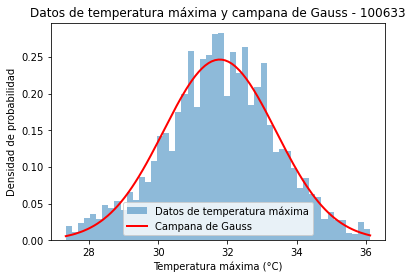

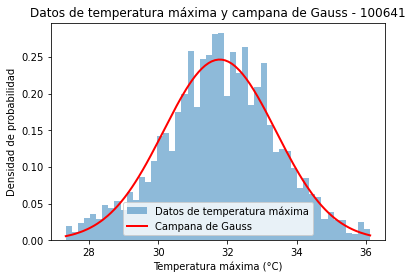

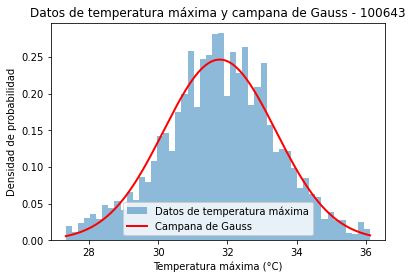

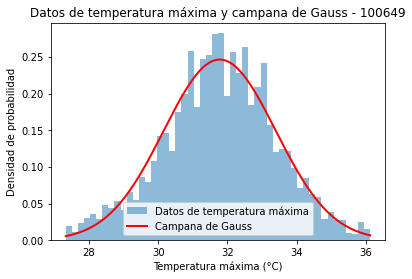

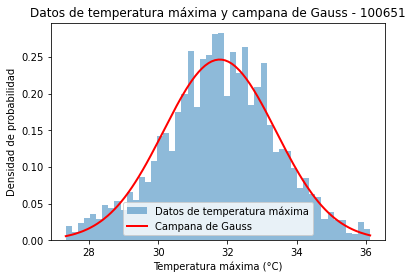

...

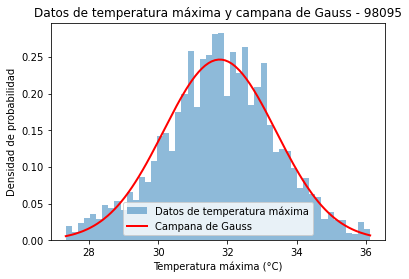

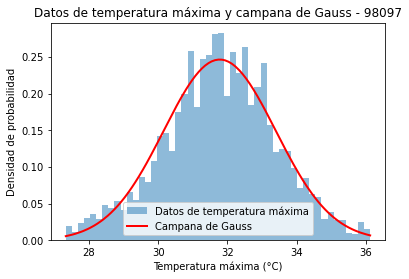

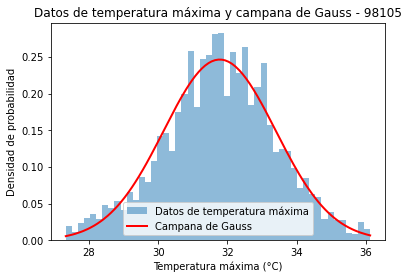

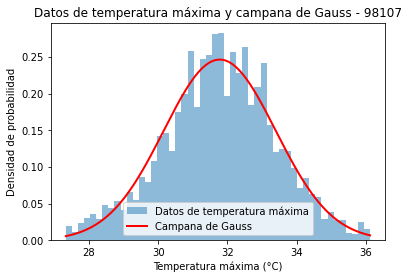

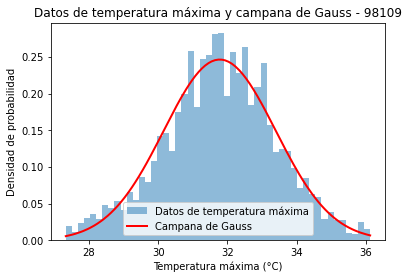

In [28]:
# Definir la función de campana de Gauss
def gaussian(x, mu, sigma):
    return 1 / (sigma * np.sqrt(2 * np.pi)) * np.exp(-0.5 * ((x - mu) / sigma) ** 2)

# Aplicar la campana de Gauss a cada tabla y guardar los resultados en una nueva lista de tablas
tmax_gauss = []
data = TempMAX_ordenada
for name,tabla in zip(NUMERO,data):
    # Calcular el promedio y la desviación estándar de los datos de precipitación
    mu = tabla['MAX'].mean()
    sigma = tabla['MAX'].std()
    # Crear un rango de valores para la variable x
    x = np.linspace(mu - 3 * sigma, mu + 3 * sigma, 100)
    # Calcular los valores de la campana de Gauss para cada valor de x
    y = gaussian(x, mu, sigma)
    # Agregar los valores de la campana de Gauss a la tabla
    tabla['GAUSS'] = np.interp(tabla['MAX'], x, y)
    # Agregar la tabla a la lista de tablas de resultados
    tmax_gauss.append(tabla)

    # Graficar los resultados para una tabla
    tabla = tmax_gauss[0]
    plt.hist(tabla['MAX'], bins=50, density=True, alpha=0.5, label='Datos de temperatura máxima')
    plt.plot(tabla['MAX'], tabla['GAUSS'], 'r-', linewidth=2, label='Campana de Gauss')
    plt.xlabel('Temperatura máxima (°C)')
    plt.ylabel('Densidad de probabilidad')
    plt.title(f'Datos de temperatura máxima y campana de Gauss - {name}')
    plt.legend()
    plt.show()

# *De aquí en adelante falta trabajar*

## Acomodar datos

In [110]:
#-------------------------Tmax-----------------------#    
TempMAX_new = []

# Iterar a través de las tablas en la lista original
for df in TempMAX_ordenada:
    # Ordenar la tabla por la columna deseada (en este ejemplo, 'LLUVIA_DIARIA')
    df_ordenado = df.sort_values('FECHA', ascending=True)
    # Agregar la tabla ordenada a la nueva lista
    TempMAX_new.append(df_ordenado)
    
#-------------------------Tmin-----------------------#
TempMIN_new = []

# Iterar a través de las tablas en la lista original
for df in TempMIN_ordenada:
    # Ordenar la tabla por la columna deseada (en este ejemplo, 'LLUVIA_DIARIA')
    df_ordenado = df.sort_values('FECHA', ascending=True)
    # Agregar la tabla ordenada a la nueva lista
    TempMIN_new.append(df_ordenado)

* Volver la columna 'FECHA' un dateintex

In [261]:
#-------------------------Tmax-----------------------#    
for i, df in enumerate(TempMAX_new):
    TempMAX_new[i] = TempMAX_new[i].set_index('FECHA')
    
#-------------------------Tmin-----------------------#
for i, df in enumerate(TempMIN_new):
    TempMIN_new[i] = TempMIN_new[i].set_index('FECHA')

## Guardar un archivo por cada estación

* Guardar cada tabla de cada estación en un CSV diferente

In [260]:
#Guardar cada tabla de cada estación en un CSV diferente
my_list = list(range(0, 154))
for a, i in zip(NUMERO,my_list):
    porestacion[i].to_csv(f'Estacion_{a}.csv', index=True)

## Obtener fecha inicial y final de cada estación

* Encontrar los valores de inicio y final de las fechas

In [262]:
my_list = list(range(0, 154))
porestacion_new=[]
for i in my_list:
    fecha_inicial = porestacion[i].index.min()
    fecha_final = porestacion[i].index.max()
    name = NUMERO[i]
    porestacion_new.append((fecha_inicial,fecha_final, name))

* Guardar el rango de fechas en un archivo .txt

In [264]:
# Abrir el archivo en modo escritura
with open("rango_fechas.txt", "w") as archivo:
    # Escribir la lista en el archivo
    for valor in porestacion_new:
        archivo.write(str(valor) + "\n")

## Obtener los estadisticos

* Eliminar los valores Nan

In [112]:
#-------------------------Tmax-----------------------#
for i, df in enumerate(TempMAX_new):
    TempMAX_new[i] = TempMAX_new[i].dropna(subset=['MAX'])
    
#-------------------------Tmin-----------------------#
for i, df in enumerate(TempMIN_new):
    TempMIN_new[i] = TempMIN_new[i].dropna(subset=['MIN'])

* Crear una lista de las temperaturas Maxima, Minima y Promedio

In [114]:
#Crear una lista vacía llamada lista_de_listas_de_tablas
lista_de_listas_de_tablas = []

# Agregar las dos listas de tablas a la lista_de_listas_de_tablas
lista_de_listas_de_tablas.append(TempMAX_new)
lista_de_listas_de_tablas.append(TempMIN_new)

* Obtener los estadisticos mean, max y min, de cada T(prom, max, min) y cada estación

In [116]:
# Creamos una lista vacía para almacenar los resultados
lista_resultados = []

# Iteramos a través de cada lista en la lista de listas de tablas
for lista_tablas in lista_de_listas_de_tablas:
    # Creamos una lista vacía para almacenar los resultados de esta lista de tablas
    lista_resultados_tablas = []
    # Iteramos a través de cada tabla en la lista de tablas
    for tabla in lista_tablas:
        # Agrupamos los datos por día y mes y calculamos la media, el máximo y el mínimo
        tabla_agrupada = tabla.groupby(tabla.index.strftime("%m%d")).agg(['mean', 'max', 'min'])
        # Agregamos la tabla agrupada a la lista de resultados para esta lista de tablas
        lista_resultados_tablas.append(tabla_agrupada)
    # Agregamos la lista de resultados para esta lista de tablas a la lista de resultados general
    lista_resultados.append(lista_resultados_tablas)

AttributeError: 'Int64Index' object has no attribute 'strftime'

* Ahora separamos los datos, cada columna la convertimos en una tabla diferente
* Ejemplo de la columna mean saldran 3 tablas (mean.prom, mean.max y mean.min)

In [273]:
# Lista de columnas a procesar
columnas = ['mean', 'max', 'min']

# Lista de listas de tablas vacía para cada columna
lista_nueva = [[] for i in range(len(columnas))]

# Bucle para iterar sobre cada columna
for i, col in enumerate(columnas):
    # Lista de listas de tablas vacía para la columna actual
    lista_col = []
    # Bucle para iterar sobre cada tabla de la lista original
    for lista_tablas in lista_resultados:
        # Lista de tablas vacía para la tabla actual
        lista_tabla_nueva = []
        # Bucle para iterar sobre cada tabla de la lista original
        for tabla in lista_tablas:
            # Selección de la columna actual y creación de una nueva tabla
            tabla_nueva = tabla[[col]]
            # Agregar la nueva tabla a la lista de tablas para la tabla actual
            lista_tabla_nueva.append(tabla_nueva)
        # Agregar la lista de tablas para la tabla actual a la lista de listas de tablas para la columna actual
        lista_col.append(lista_tabla_nueva)
    # Agregar la lista de listas de tablas para la columna actual a la lista de listas de tablas para todas las columnas
    lista_nueva[i] = lista_col

* Se selecciona solo la columna que necesitamos, para que la fecha no cause problemas

In [274]:
# Iterar sobre cada lista en la lista principal
lista_de_listas_de_columnas = []
for lista_de_tablas in lista_nueva:
    listas_de_columnas = []
    for lista in lista_de_tablas:
        columnas = []
        for tabla in lista:
            df = tabla.iloc[:, 0]
            columnas.append(df)
        listas_de_columnas.append(columnas)
    lista_de_listas_de_columnas.append(listas_de_columnas)

* Volvemos un dataframe cada estadistico.T(prom, max, min) y luego transponemos cada dataframe

In [276]:
# Creamos una lista vacía para almacenar los nuevos DataFrames
lista_de_dataframes = []

# Recorremos cada lista en la lista de listas de listas de tablas
for lista_de_listas_de_tablas in lista_de_listas_de_columnas:
    
    # Creamos una lista vacía para almacenar los nuevos DataFrames de esta lista
    lista_de_dataframes_de_esta_lista = []
    
    # Recorremos cada tabla dentro de cada lista
    for tabla in lista_de_listas_de_tablas:
        
        # Convertimos la tabla en un DataFrame y la transponemos
        df = pd.DataFrame(tabla).transpose()
        
        # Agregamos el nuevo DataFrame a la lista de DataFrames de esta lista
        lista_de_dataframes_de_esta_lista.append(df)
    
    # Agregamos la lista de DataFrames de esta lista a la lista general
    lista_de_dataframes.append(lista_de_dataframes_de_esta_lista)

* Renombrar las columnas

In [277]:
# Cambiar los nombres de las columnas en cada DataFrame
for lista in lista_de_dataframes:
    for df in lista:
        df.columns = NUMERO

## Guardar estadisticos en excel

In [280]:
# Crear el objeto ExcelWriter
writer = pd.ExcelWriter('Climatologia_Diaria_Observada_Temperatura_20230429.xlsx', engine='xlsxwriter')

# Escribir los DataFrames en diferentes hojas
lista_de_dataframes[0][0].to_excel(writer, sheet_name='mean_tmax', index=True)
lista_de_dataframes[1][0].to_excel(writer, sheet_name='max_tmax', index=True)
lista_de_dataframes[2][0].to_excel(writer, sheet_name='min_tmax', index=True)
lista_de_dataframes[0][1].to_excel(writer, sheet_name='mean_tmin', index=True)
lista_de_dataframes[1][1].to_excel(writer, sheet_name='max_tmin', index=True)
lista_de_dataframes[2][1].to_excel(writer, sheet_name='min_tmin', index=True)

# Guardar el archivo Excel
writer.save()

## Abrir lista de estaciones

In [281]:
#Cargar la lista de estaciones que contienen el rango de fechas
estaciones = pd.read_excel(r'/Users/arias/OneDrive/Documentos/UCR/TFG/Datos/Observada/Temperatura/Lista de estaciones.xlsx')

In [282]:
estaciones

,NUMERO,NOMBRE,LATITUD NORTE,LONGITUD OESTE,ALTITUD (msnm),INICIO,FINAL,ESTACION
0,100633,FINCA EL PATIO. PUERTO JIMENEZ,"08º 36' 04.6""","83º25'52.2""",24,2003-10-17,2022-12-31,100633
1,100641,COOPEAGROPAL. LAUREL .,"08º 28' 17.6""","82º51'38.4""",38,2007-03-11,2022-12-31,100641
2,100643,RIO CLARO,"08º 40' 26.5""","83º03'43.2""",51,2009-11-25,2022-12-31,100643
3,100649,FUNDACION NEOTROPICA. RINCON DE OSA,"08º 42' 2.9""","83º30'49.4""",80,2013-01-29,2022-11-10,100649
4,100651,COTO 49. CIUDAD NEILY,"08º 37' 52.3""","82º58'00.7""",30,2013-05-17,2022-12-31,100651
...,...,...,...,...,...,...,...,...
149,98095,ALTAMIRA,"09º 01' 45.7""","83º00'28.7""",1370,2002-01-01,2022-12-31,98095
150,98097,MONTECARLO. PZ,"09º 21' 28""","83º36'03""",1005,2008-06-18,2022-12-31,98097
151,98105,PLANTA DE VOLCAN. BUENOS AIRES,"09º 12' 15""","83º27'2.49""",416,2013-11-22,2022-12-07,98105
152,98107,CAFETALERA EL INDIO. SAN VITO. PUNTARENAS,"08º 49' 57.9""","82º57'10.5""",1027,2016-12-16,2022-11-10,98107
